In [2]:
import os
from constants import *
from cleanvision import Imagelab
import pandas as pd
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)

In [3]:
KAGGLE_HERBARIUM_22_TRAIN

'/projectnb/herbdl/data/kaggle-herbaria/herbarium-2022/train_images/'

## Kaggle images

In [4]:
kaggle22_train = pd.read_csv(KAGGLE_HERBARIUM_22_TRAIN_CSV).drop(columns=['Unnamed: 0'])

kaggle22_file_paths = [os.path.join(KAGGLE_HERBARIUM_22_TRAIN, file) for file in kaggle22_train['filename']]
print(f"Number of images in Kaggle Herbarium 22 Train: {len(kaggle22_file_paths)}")
kaggle22_file_paths[:5]

Number of images in Kaggle Herbarium 22 Train: 839772


['/projectnb/herbdl/data/kaggle-herbaria/herbarium-2022/train_images/000/00/00000__001.jpg',
 '/projectnb/herbdl/data/kaggle-herbaria/herbarium-2022/train_images/000/00/00000__002.jpg',
 '/projectnb/herbdl/data/kaggle-herbaria/herbarium-2022/train_images/000/00/00000__003.jpg',
 '/projectnb/herbdl/data/kaggle-herbaria/herbarium-2022/train_images/000/00/00000__004.jpg',
 '/projectnb/herbdl/data/kaggle-herbaria/herbarium-2022/train_images/000/00/00000__005.jpg']

In [5]:
kaggle21_train = pd.read_csv(KAGGLE_HERBARIUM_21_METADATA_CSV).drop(columns=['Unnamed: 0'])

kaggle21_file_paths = [os.path.join(KAGGLE_HERBARIUM_21_TRAIN, file) for file in kaggle21_train['filename']]
print(f"Number of images in Kaggle Herbarium 21 Train: {len(kaggle21_file_paths)}")
kaggle21_file_paths[:5]

Number of images in Kaggle Herbarium 21 Train: 2257759


['/projectnb/herbdl/data/kaggle-herbaria/herbarium-2021/train/images/604/92/1814367.jpg',
 '/projectnb/herbdl/data/kaggle-herbaria/herbarium-2021/train/images/108/24/1308257.jpg',
 '/projectnb/herbdl/data/kaggle-herbaria/herbarium-2021/train/images/330/76/1270453.jpg',
 '/projectnb/herbdl/data/kaggle-herbaria/herbarium-2021/train/images/247/99/1123834.jpg',
 '/projectnb/herbdl/data/kaggle-herbaria/herbarium-2021/train/images/170/18/1042410.jpg']

In [6]:
KAGGLE_FILEPATHS = kaggle22_file_paths + kaggle21_file_paths
print(f"Total number of images from Kaggle: {len(KAGGLE_FILEPATHS)}")

Total number of images from Kaggle: 3097531


In [7]:
kaggle21_train['scientificName'] = kaggle21_train['family'] + ' ' + kaggle21_train['genus'] + ' ' + kaggle21_train['species']
kaggle22_train['scientificName'] = kaggle22_train['family'] + ' ' + kaggle22_train['genus'] + ' ' + kaggle22_train['species']

In [8]:
# find the overlap between the two datasets
kaggle21_train['scientificName'] = kaggle21_train['scientificName'].str.lower()
kaggle22_train['scientificName'] = kaggle22_train['scientificName'].str.lower()

# find the overlap in the scientific names
overlap = kaggle21_train['scientificName'].isin(kaggle22_train['scientificName'])
print(f"Number of overlapping scientific names: {overlap.sum()}")

Number of overlapping scientific names: 1109679


## GBIF Images

In [11]:
harvard_image_data = pd.read_csv(GBIF_MULTIMEDIA_DATA, sep="\t")
image_dir = GBIF_INSTALL_PATH   
# harvard_dataset = harvard_image_data[['gbifID', 'family', 'species']]
harvard_image_data.head()

/scratch/1037895.1.cds-gpu/ipykernel_3387997/1076665397.py:1: DtypeWarning: Columns (4,6) have mixed types. Specify dtype option on import or set low_memory=False.
  harvard_image_data = pd.read_csv(GBIF_MULTIMEDIA_DATA, sep="\t")


,gbifID,type,format,identifier,references,title,description,source,audience,created,creator,contributor,publisher,license,rightsHolder
0,1927768154,StillImage,image/jpeg,http://sweetgum.nybg.org/images3/3065/424/03698350.jpg,NaN,NaN,NaN,NaN,NaN,NaN,The New York Botanical Garden,NaN,NaN,http://creativecommons.org/licenses/by/4.0/,The New York Botanical Garden
1,1927768159,StillImage,image/jpeg,http://sweetgum.nybg.org/images3/3143/170/03554084.jpg,NaN,NaN,NaN,NaN,NaN,NaN,The New York Botanical Garden,NaN,NaN,http://creativecommons.org/licenses/by/4.0/,The New York Botanical Garden
2,1927768172,StillImage,image/jpeg,http://sweetgum.nybg.org/images3/635/056/00039029.jpg,NaN,NaN,NaN,NaN,NaN,NaN,The New York Botanical Garden,NaN,NaN,http://creativecommons.org/licenses/by/4.0/,The New York Botanical Garden
3,1927768186,StillImage,image/jpeg,http://sweetgum.nybg.org/images3/393/524/v-035-01297411.jpg,NaN,NaN,NaN,NaN,NaN,NaN,The New York Botanical Garden,NaN,NaN,http://creativecommons.org/licenses/by/4.0/,The New York Botanical Garden
4,1927768190,StillImage,image/jpeg,http://sweetgum.nybg.org/images3/714/539/01497227.jpg,NaN,NaN,NaN,NaN,NaN,NaN,The New York Botanical Garden,NaN,NaN,http://creativecommons.org/licenses/by/4.0/,The New York Botanical Garden


In [16]:
with open("/projectnb/herbdl/data/GBIF/occurrence.txt") as f:
    gbif_occurrence = f.readlines()

gbif_occurrence = [line.split("\t") for line in gbif_occurrence]




In [17]:
print(gbif_occurrence[:5])

[['gbifID', 'accessRights', 'bibliographicCitation', 'language', 'license', 'modified', 'publisher', 'references', 'rightsHolder', 'type', 'institutionID', 'collectionID', 'datasetID', 'institutionCode', 'collectionCode', 'datasetName', 'ownerInstitutionCode', 'basisOfRecord', 'informationWithheld', 'dataGeneralizations', 'dynamicProperties', 'occurrenceID', 'catalogNumber', 'recordNumber', 'recordedBy', 'recordedByID', 'individualCount', 'organismQuantity', 'organismQuantityType', 'sex', 'lifeStage', 'reproductiveCondition', 'caste', 'behavior', 'vitality', 'establishmentMeans', 'degreeOfEstablishment', 'pathway', 'georeferenceVerificationStatus', 'occurrenceStatus', 'preparations', 'disposition', 'associatedOccurrences', 'associatedReferences', 'associatedSequences', 'associatedTaxa', 'otherCatalogNumbers', 'occurrenceRemarks', 'organismID', 'organismName', 'organismScope', 'associatedOrganisms', 'previousIdentifications', 'organismRemarks', 'materialEntityID', 'materialEntityRemarks

In [13]:
gbif_occurence = pd.read_csv("/projectnb/herbdl/data/GBIF/occurrence.txt", sep="\t")
gbif_occurence.head()

TypeError: read_csv() got an unexpected keyword argument 'handle_errors'

Checking for dark, light, odd_aspect_ratio, low_information, exact_duplicates, near_duplicates, blurry, grayscale, odd_size images ...


  0%|          | 0/3097531 [00:00<?, ?it/s]

  0%|          | 0/3097531 [00:00<?, ?it/s]

Issue checks completed. 986151 issues found in the dataset. To see a detailed report of issues found, use imagelab.report().
Issues found in images in order of severity in the dataset

|    | issue_type       |   num_images |
|---:|:-----------------|-------------:|
|  0 | odd_size         |       467779 |
|  1 | exact_duplicates |       458430 |
|  2 | near_duplicates  |        59841 |
|  3 | low_information  |           42 |
|  4 | odd_aspect_ratio |           31 |
|  5 | light            |           27 |
|  6 | dark             |            1 |
|  7 | blurry           |            0 |
|  8 | grayscale        |            0 | 

--------------------- odd_size images ----------------------

Number of examples with this issue: 467779
Examples representing most severe instances of this issue:



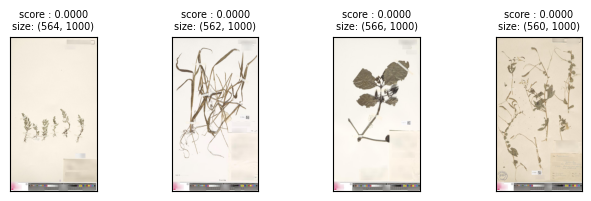

----------------- exact_duplicates images ------------------

Number of examples with this issue: 458430
Examples representing most severe instances of this issue:

Set: 0


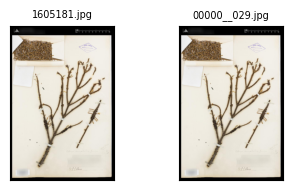

Set: 1


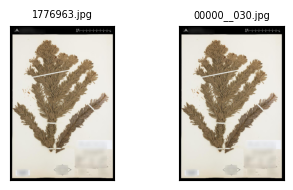

Set: 2


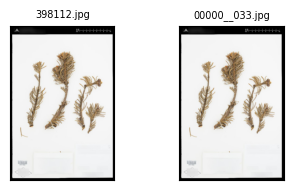

Set: 3


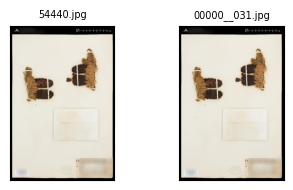

------------------ near_duplicates images ------------------

Number of examples with this issue: 59841
Examples representing most severe instances of this issue:

Set: 0


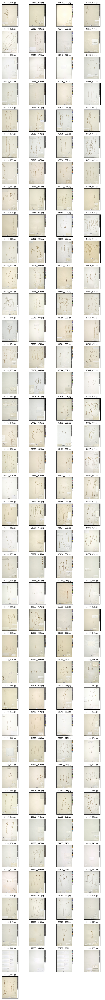

Set: 1


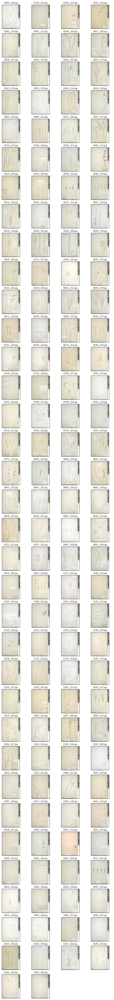

Set: 2


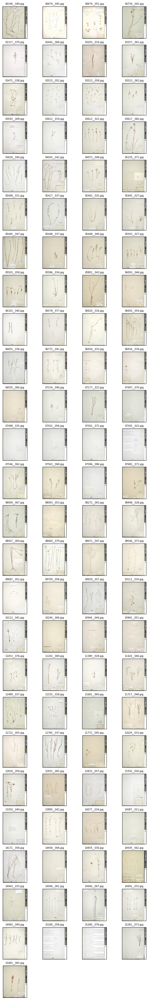

Set: 3


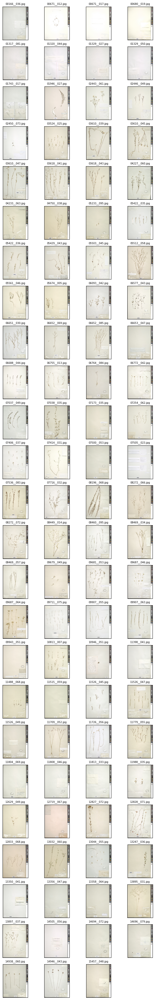

------------------ low_information images ------------------

Number of examples with this issue: 42
Examples representing most severe instances of this issue:



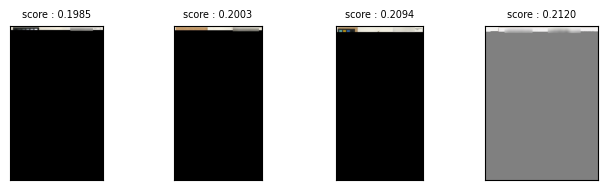

----------------- odd_aspect_ratio images ------------------

Number of examples with this issue: 31
Examples representing most severe instances of this issue:



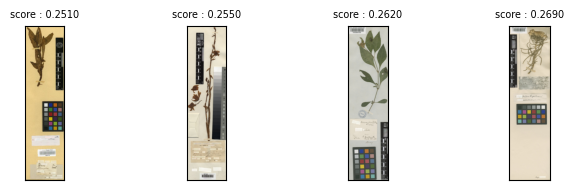

----------------------- light images -----------------------

Number of examples with this issue: 27
Examples representing most severe instances of this issue:



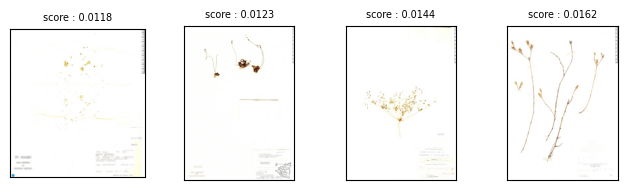

----------------------- dark images ------------------------

Number of examples with this issue: 1
Examples representing most severe instances of this issue:



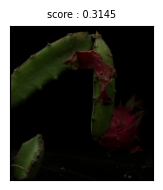

In [18]:
# Specify path to folder containing the image files in your dataset
imagelab = Imagelab(filepaths=KAGGLE_FILEPATHS)

# Automatically check for a predefined list of issues within your dataset
imagelab.find_issues()

# Produce a neat report of the issues found in your dataset
imagelab.report()